In [ ]:
HR Analytics Project- Understanding the Attrition in HR
Project Description
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees,
not just this but there are training programs within the companies for their existing employees as well. The aim of these 
programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about 
improving the performance of employees?

HR Analytics
Human resource analytics (HR analytics) is an area in the field of analytics that refers to 
applying analytic processes to the human resource department of an organization in the hope of 
improving employee performance and therefore getting a better return on investment. 
HR analytics does not just deal with gathering data on employee efficiency. 
Instead, it aims to provide insight into each process by gathering data and then using it
to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition 
is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, 
work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the 
first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and 
new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee 
turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is 
especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. 
Errors and issues are more likely if you constantly have new workers.

Attrition has two outcomes,its either an employee stays or leaves the company,this is a binary classification problem.


In [1]:
#Import the necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
#loading the data
df=pd.read_csv(r"C:\Users\bee\Desktop\Data set\WA_Fn-UseC_-HR-Employee-Attrition.csv")

In [4]:
#loading first five records of the dataset
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [5]:
#loading last five records of the dataset
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [6]:
#Checking shapes of each data set
df.shape

(1470, 35)

In [7]:
#checking dataset columns
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [8]:
#printing a list of columns to have a clear view of coulmns in the dataset
df.columns.tolist()

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

In [ ]:
#Attaching meaning to column headings for us to draw an idea of their relevance to attrition

Age- age of the employee
Attrition- this is churn or rate at which employees leave employment for the company
BusinessTravel- travel for business purpose
DailyRate- daily rate of pay for employees
Department- section of the company where an employee is based
DistanceFromHome- distance between place of residence and work,this infers into travel time to work
Education- level of education,this is provided by ranking,the higher the rank number or notation the better the level of education
EducationField- discipline in which the employee studied or area of expertise
EmployeeCount- number of employees in a company
EmployeeNumber-unique employee ID for administrative purpose for example payroll and so on 
EnvironmentSatisfaction-satisfaction of the employees with the working environment
Gender- the sex that the employee identifies with
HourlyRate- hourly rate of pay for employees
JobInvolvement-level of engagement required of the employee while perfoming thei duties
JobLevel- the employee level of work based on the organizational structure
JobRole-position or role of the employee
JobSatisfaction-a ranking to gauge the level at which an employeeeis satisfied with their job
MaritalStatus-whther married or not
MonthlyIncome-monthly salary
MonthlyRate-monthly rate of pay for employees
NumCompaniesWorked-number of previous companies the employee was engaged with
Over18-if the employee is over 18 or not
OverTime-do employees wotk overtime or not
PercentSalaryHike-percentage increase in salary
PerformanceRating-employee perfomance rating
RelationshipSatisfaction-employee satisfaction with their relationships
StandardHours-normal woking hours for all employees
StockOptionLevel-employee equity acqusition option level
TotalWorkingYears-total years the employee has worked
TrainingTimesLastYear-number of times the employee was engaged in training and development 
WorkLifeBalance-employees view on work life balance
YearsAtCompany- tenure of service
YearsInCurrentRole-years worked in the current role
YearsSinceLastPromotio-years since last promotion
YearsWithCurrManager-years worked under current manager

Out of the 35 columns in the data,the following have classifications on the basis of ranking

Education
EnvironmentSatisfaction
JobInvolvement
JobSatisfaction
PerformanceRating
RelationshipSatisfaction
WorkLifeBalance

In [9]:
#Checking Duplicate value in dataframe
print("Total Duplicate Rows are",df.duplicated().sum())#no duplicates

Total Duplicate Rows are 0


In [10]:
#checking datatype
df.dtypes


Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [11]:
#Checking information 
df.info()

#26 columns are int64 and 9 are object data
#Memory usage is just over 402 KB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [12]:
#Checking unique values of each columns
df.nunique().to_frame("No. of Unique values")#I can clearly see the number of uniques values per each column

,No. of Unique values
Age,43
Attrition,2
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EmployeeCount,1
EmployeeNumber,1470


In [13]:
#checking for null values(there are no null values)
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

<Axes: >

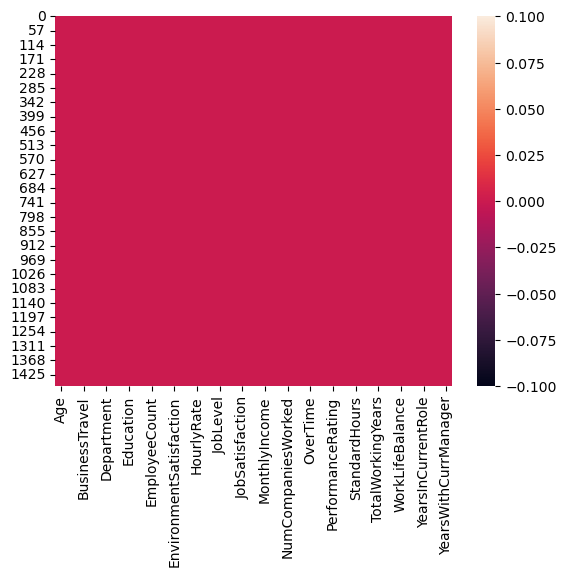

In [14]:
#checking null values using the heatmap(there no null values in the data set)
sns.heatmap(df.isnull())

In [15]:
#Statistical summary of numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


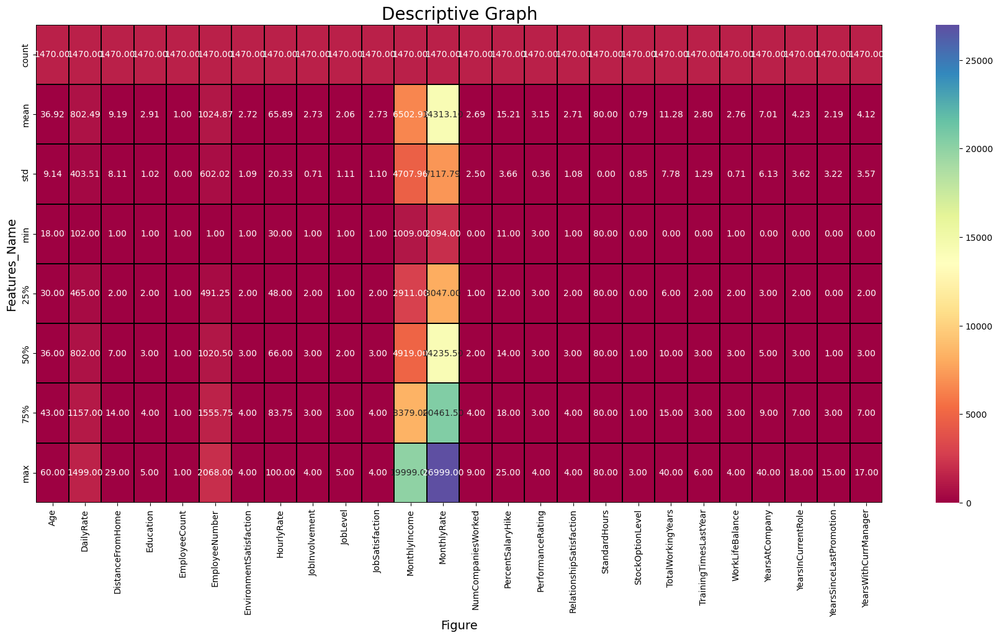

In [16]:
#Graphical view of statistical data description
plt.figure(figsize=(22,10))
sns.heatmap(df.describe(),annot=True,fmt='0.2f',linewidth=0.2,linecolor='black',cmap='Spectral')
plt.xlabel('Figure',fontsize=14)
plt.ylabel('Features_Name',fontsize=14)
plt.title('Descriptive Graph',fontsize=20)
plt.show()

In [18]:
#Split between Categorical and Numerical columns

categorical = ['Attrition', 'BusinessTravel', 'EducationField','Gender','JobRole','MaritalStatus','OverTime','Department']
numerical = ['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager']

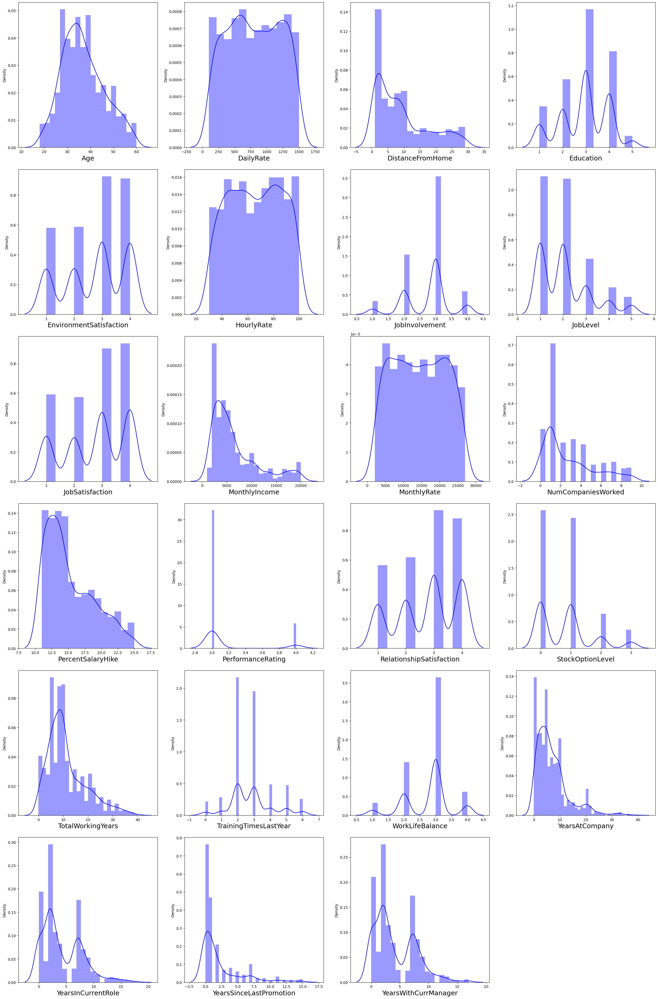

In [19]:
#Checking the distribution of data using distribution plot
#I see a normal distribution in represented by the bell shape of the curves with a lot of skeweness which will be explained below and dealt with later

plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in numerical:
    if plotnumber <=23:
        ax = plt.subplot(8,4,plotnumber)
        sns.distplot(df[column], color = 'blue')
        plt.xlabel(column,fontsize=18)
        
    plotnumber +=1
plt.tight_layout()

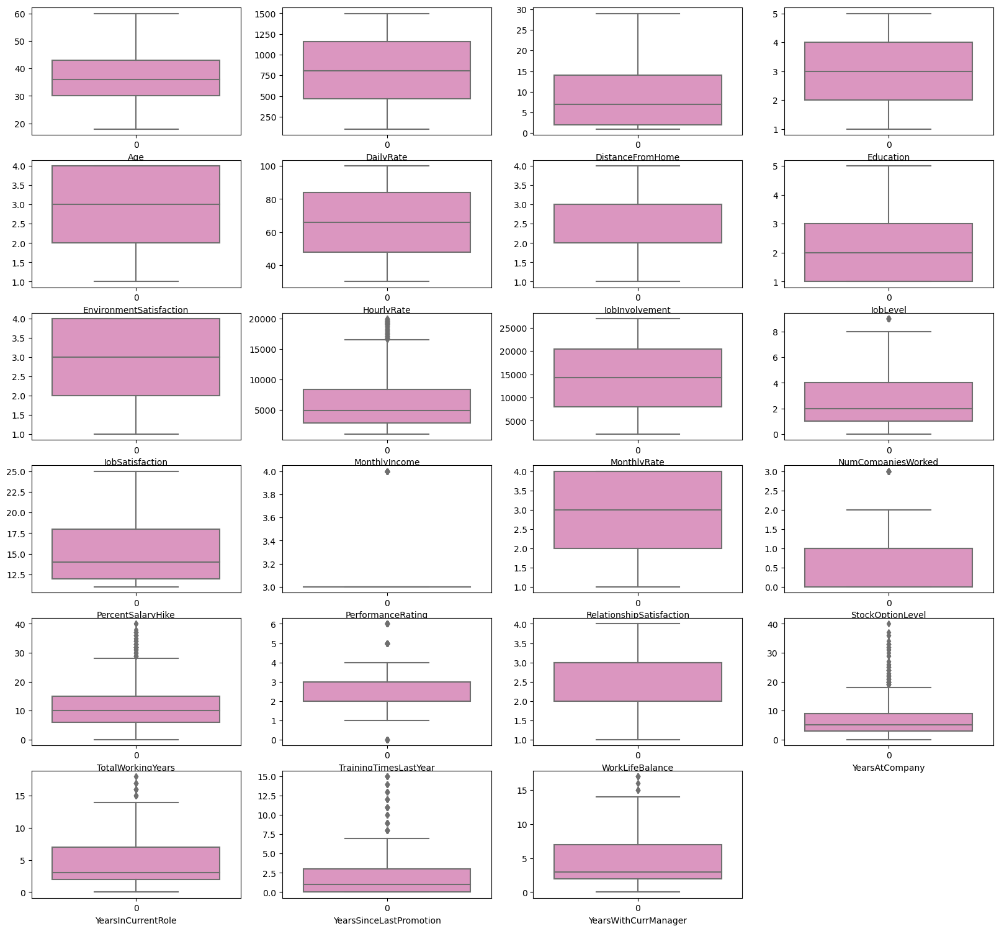

In [20]:
#Let's check data distribution and outliers using boxplot
#please note that this is for numerical columns only and its evident that there are outliers in all columns as mention in the statistial summary
#I only considered only numerical columns
#Outliers will be dealt with later
plt.figure(figsize=(20,25))
p=1
for column in numerical:
    if p<=23:
        plt.subplot(8,4,p)
        sns.boxplot(df[column], palette ="Set2_r")
        plt.xlabel(column)
        
    p+=1
    
plt.show()

In [ ]:
Interpretation of the Statistical summary of dataset

Overview
#from the statistical description above the count of all columns are similar (1470) therefore no missing data values

#mean value of  columns namely('DistanceFromHome','EmployeeNumber','JobLevel','MonthlyIncome','MonthlyRate',
'NumCompaniesWorked','PerformanceRating','TotalWorkingYears','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion',
'YearsWithCurrManager') is greater than the median(second percentile)therefore the data is skewed to the right.This will be dealt with later

#mean value of columns namely ('Education','EnvironmentSatisfaction','HourlyRate','JobInvolvement','JobSatisfaction',
'RelationshipSatisfaction','StockOptionLevel','TrainingTimesLastYear','WorkLifeBalance')is less than the median therefore skewed to the left.

#In all columns there are huge differences between the third percentile and max values which signify the existance of outliers in the data. 

Each column statistical highlight

Age:
The average age of employees is approximately 36.92 with a minimum of 18 and a maximum of 60.
The standard deviation is around 9.14, showing the variability in ages.

DailyRate:
The average DailyRate for employees is approximately 802.49 with a minimum of 102 and a maximum of 1,499
thus a remarkable range in daily rates.



DistanceFromHome:
The average distance from home to work is approximately 9.19 miles or kilometres.
Employees' distances from home range from a minimum of 1  to a 29 miles or kilometres.

Education:
The education levels range from a minimum of 1 to a maximum of 5,this is a ranking
75% have an education level of 4 or lower.

EmployeeCount:
The employee count of 1 is the same for all records.

EmployeeNumber:
This is a mere employees identification system
There is a wide range in Employee numbers in the dataset  from a minimum of 1 to a maximum of 2,068.


EnvironmentSatisfaction:
The  average environment satisfaction level is about 2.72.
Satisfaction levels are a ranking ranging from a minimum of 1 to a maximum of 4.


HourlyRate:
The average hourly rate is approximately 65.89.
Hourly rates vary from a minimum of 30 to a maximum of 100.

JobInvolvement:
The  average job involvement level of approximately 2.73.
Job involvement levels are ranked from a minimum of 1 to a maximum of 4.

JobLevel:
The average job level is approximately 2.06.
Job levels are ranked  from a minimum of 1 to a maximum of 5.

JobSatisfaction:
The average job satisfaction level is around 2.73.
Job satisfaction is ranked from a minimum of 1 to a maximum of 4.

MonthlyIncome:
The average monthly income is about 6,502.93.
Monthly income ranges from a minimum of 1,009 to a maximum of 19,999.

MonthlyRate:
The average monthly rate is approximately 14,313.10.
Monthly rates vary from a minimum of 2,094 to a maximum of 26,999.

NumCompaniesWorked:
The average number of companies worked is approximately 2.69.
Number of companies worked range from a minimum of 0 to a maximum of 9.

PercentSalaryHike:
The average percentage salary hike is about 15.21.
Percentage salary hikes range from a minimum of 11 to a maximum of 25.

PerformanceRating:
The majority having a performance rating of 3.
This is a ranking from a minimun of 3  to a maximum of 4

RelationshipSatisfaction:
The average relationship satisfaction level of about 2.71.
Satisfaction levels for relationships are ranked from a minimum of 1 to a maximum of 4.

StandardHours:
All the records have the same standard working hours of 80,there are no difference

StockOptionLevel:
The average stock option level is approximately 0.79.
Stock option levels range from a minimum of 0 to a maximum of 3.

TotalWorkingYears:
The average total working years is approximately 11.28.
Total working years vary from a minimum of 0 to a maximum of 40.


TrainingTimesLastYear:
The average number of training times last year is about 2.80.
The number of training times last year vary from a minimum of 0 to a maximum of 6.

WorkLifeBalance:
The dataset contains 1,470 records, with an average work-life balance rating of about 2.76.
The standard deviation is about 0.71, suggesting some variation in work-life balance ratings.
Work-life balance is a ranking from a minimum of 1 to a maximum of 4.


YearsAtCompany:
The average number of years at the company is around 7.01.
The number of years at the company vary from a minimum of 0 to a maximum of 40.


YearsInCurrentRole:
The average number of years in the current role is about 4.23.
The number of years in the current role starts from a minimum of 0 to a maximum of 18.


YearsSinceLastPromotion:
There are 1,470 records in the dataset, with an average number of years since the last promotion of about 2.19.
The number of years since the last promotion ranges from a minimum of 0 to a maximum of 15.


YearsWithCurrManager:
The average number of years with the current manager of approximately 4.12.
The number of years with the current manager ranges from a minimum of 0 to a maximum of 17.






In [21]:
#Summary of columns with categorical data
df.describe(include='object')

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
count,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,6,2,9,3,1,2
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,Y,No
freq,1233,1043,961,606,882,326,673,1470,1054


In [ ]:
#Similar to numerical data records,there are 1470 records under the category label.
#there are 9 columns of categorical data namely (Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime)
#In the same way,there are 2 unique categories in the Attrition column with No being the top and most frequent.All the other
columns can be explained in the same way


In [22]:
#Dropping irrelevant columns
#I will drop the following columns as they have no bearing on the subject matter
#EmployeeCount-there is only one count for a person,this does not change
#StandardHours- a constant value agreed at point of employment acceptance
#EmployeeNumber-it is a mere employee ID for administration purpose

df.drop(columns=['EmployeeCount','StandardHours', 'EmployeeNumber', 'Over18'], axis=1, inplace=True)

In [23]:
#check the shape of the data after dropping columns 
df.shape

(1470, 31)

In [24]:
#Univariate analysis
#Value Counts of categorical columns
for i in categorical:
    print(df[i].value_counts())
    print("\n")

No     1233
Yes     237
Name: Attrition, dtype: int64


Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64


Male      882
Female    588
Name: Gender, dtype: int64


Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: JobRole, dtype: int64


Married     673
Single      470
Divorced    327
Name: MaritalStatus, dtype: int64


No     1054
Yes     416
Name: OverTime, dtype: int64


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64




In [ ]:
Explanation per column,this is also visualized below

Attrition- most employees  are in the No category hence do not leave

BusinessTravel- Majority of the Employees seldom travel

EducationField- the most  common field of study among employees is Life Sciences followed by Medical

Gender- the male gender dorminate the workforce

JobRole- the jobrole with the most employees is Sales Executive followed by Research Scientist and Laboratory technician respectively

Majority of the workforce are married

Majority of the workforce do not work overtime

The most employees are in the Research and development department

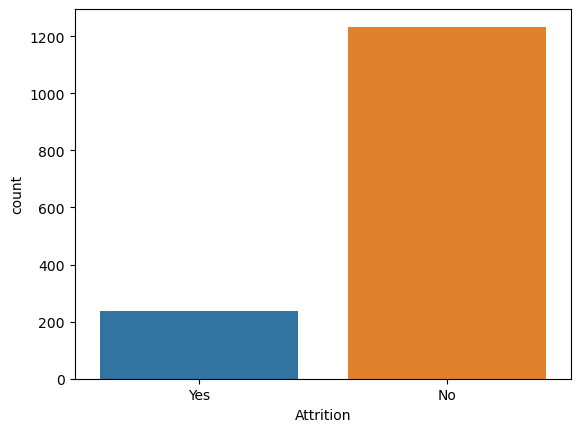

In [25]:
#Data Visualizaton -Univariate Analysis

#Visualize attrition
ax=sns.countplot(x='Attrition',data=df)
plt.show()

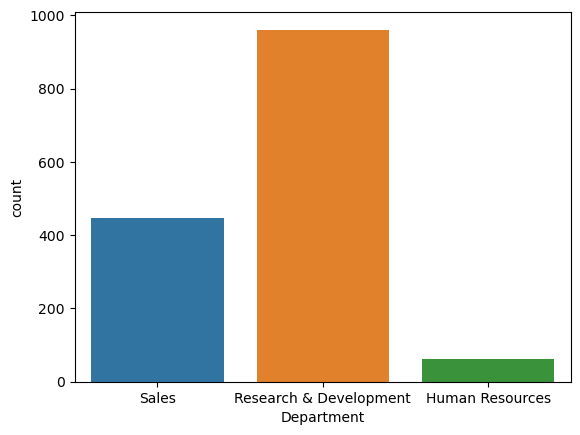

In [26]:
#Visualize Department
ax=sns.countplot(x='Department',data=df)
plt.show()

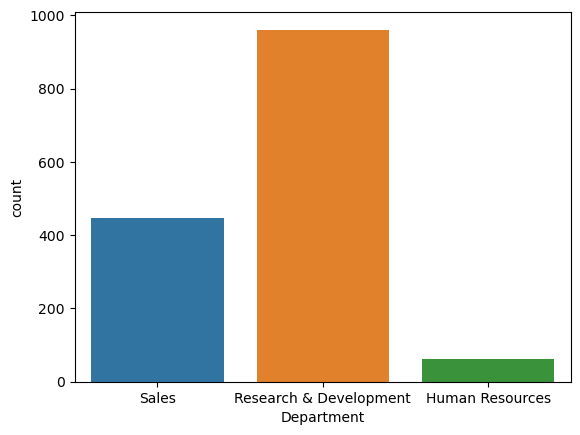

In [27]:
#Visualize BusinessTravel
ax=sns.countplot(x='Department',data=df)
plt.show()

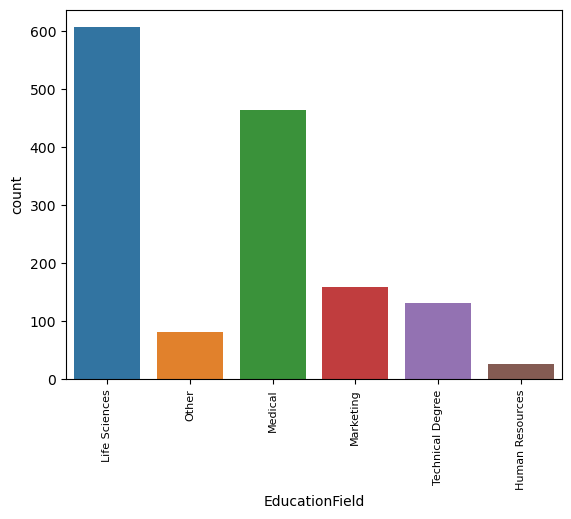

In [28]:
#Visualize EducationField
ax=sns.countplot(x='EducationField',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

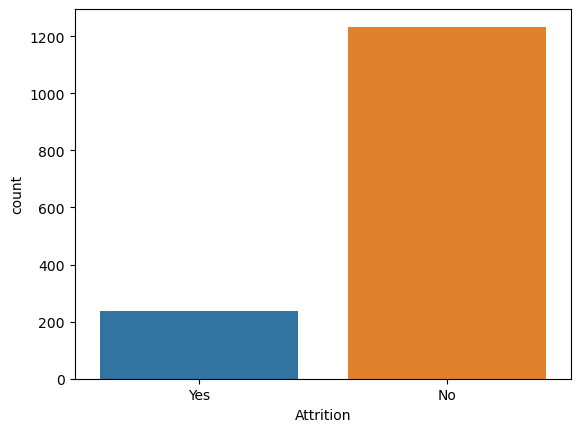

In [29]:
#Visualize Gender
ax=sns.countplot(x='Attrition',data=df)
plt.show()

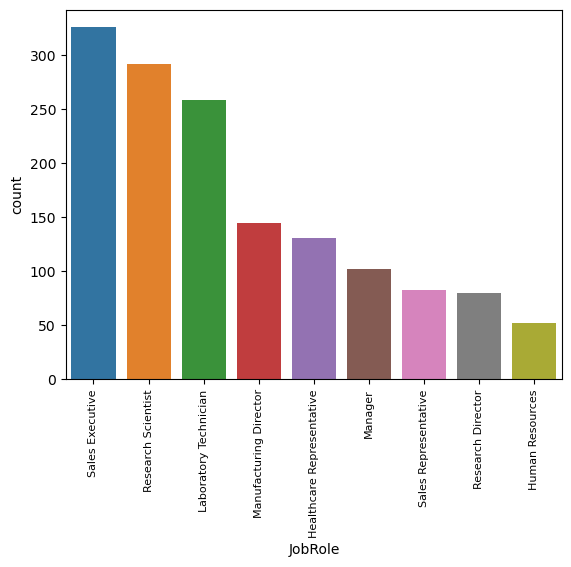

In [30]:
#Visualize JobRole
ax=sns.countplot(x='JobRole',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

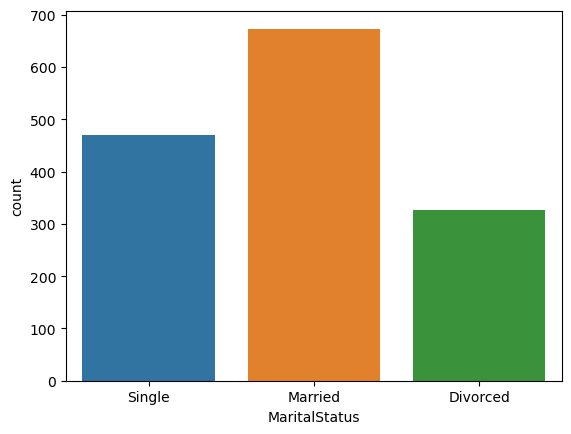

In [31]:
#Visualize MaritalStatus
ax=sns.countplot(x='MaritalStatus',data=df)
plt.show()

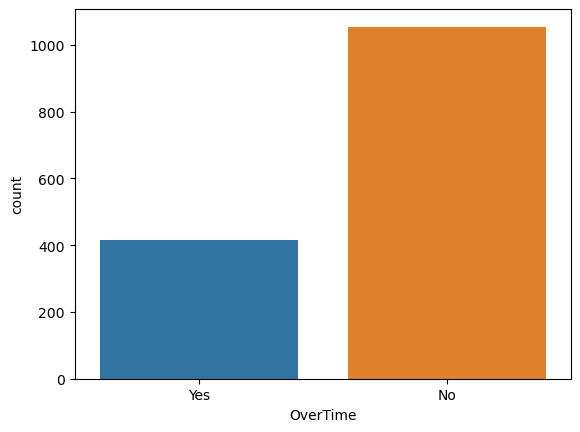

In [32]:
#Visualize OverTime
ax=sns.countplot(x='OverTime',data=df)
plt.show()

In [33]:
#Univariate analysis-Numeric columns
for i in numerical:
    print(df[i].value_counts())
    print("\n")

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64


691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64


2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23     27
29     27
15     26
18     26
26     25
25     25
20     25
28     23
19     22
14     21
12     20
17     20
22     19
13     19
21     18
27     12
Name: DistanceFromHome, dtype: int64


3    572
4    398
2    282
1    170
5     48
Name: Education, dtype: int64


3    453
4    446
2    287

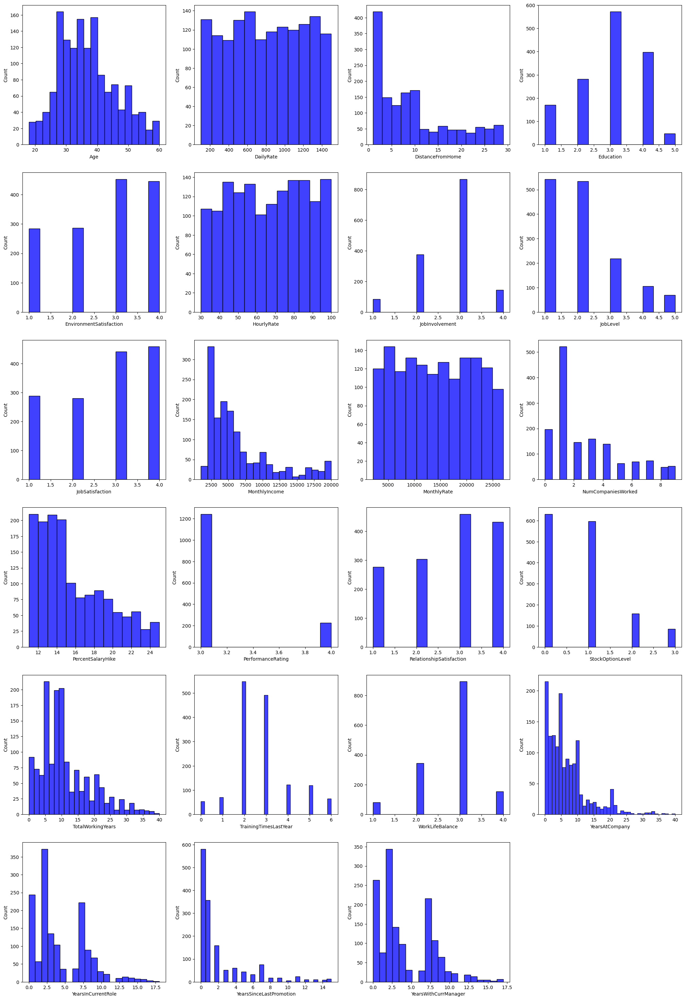

In [34]:
#Getting a graphical view of value counts for each column
#this also collaborate the observations made in statistical analysis of these columns
plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in numerical:
    if plotnumber <=23:
        ax = plt.subplot(8,4,plotnumber)
        sns.histplot(df[column], color = 'blue')
        plt.xlabel(column,fontsize=10)
        
    plotnumber +=1
plt.show()

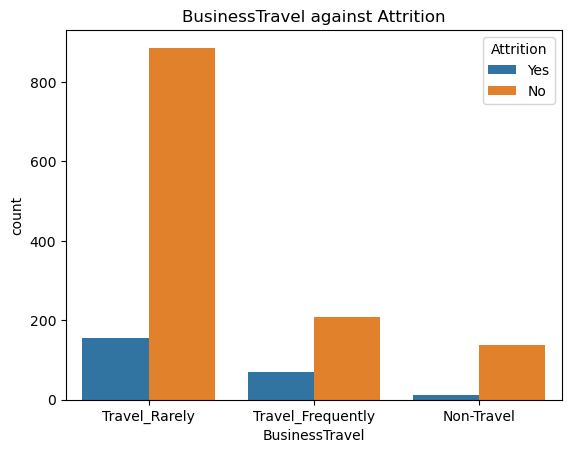

In [35]:
#Bivariate analysis of categorical columns
ax= sns.countplot(x='BusinessTravel', hue='Attrition',data=df)
plt.title("BusinessTravel against Attrition")
plt.show()

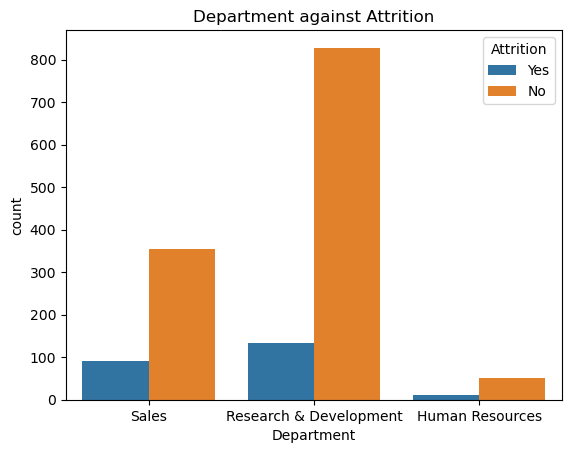

In [36]:
ax= sns.countplot(x='Department', hue='Attrition',data=df)
plt.title("Department against Attrition")
plt.show()

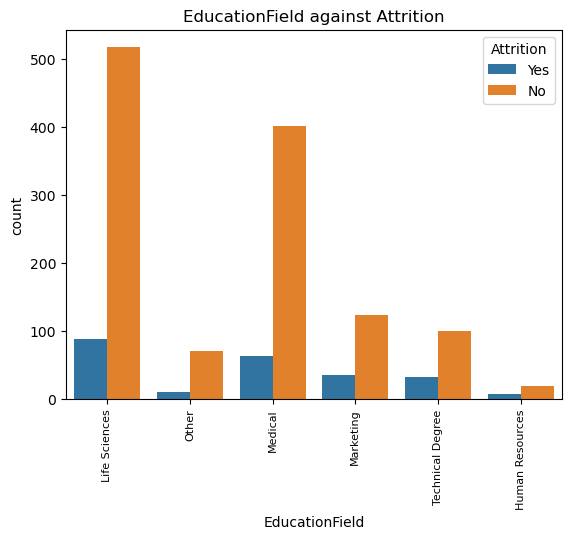

In [37]:
ax= sns.countplot(x='EducationField', hue='Attrition',data=df)
plt.title("EducationField against Attrition")
plt.xticks(rotation=90, fontsize=8)
plt.show()


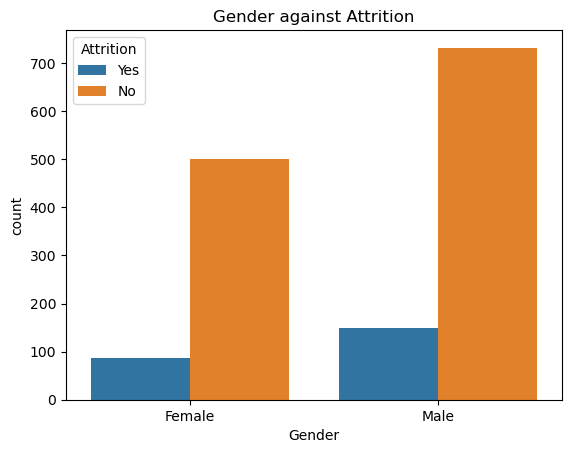

In [38]:
ax= sns.countplot(x='Gender', hue='Attrition',data=df)
plt.title("Gender against Attrition")
plt.show()

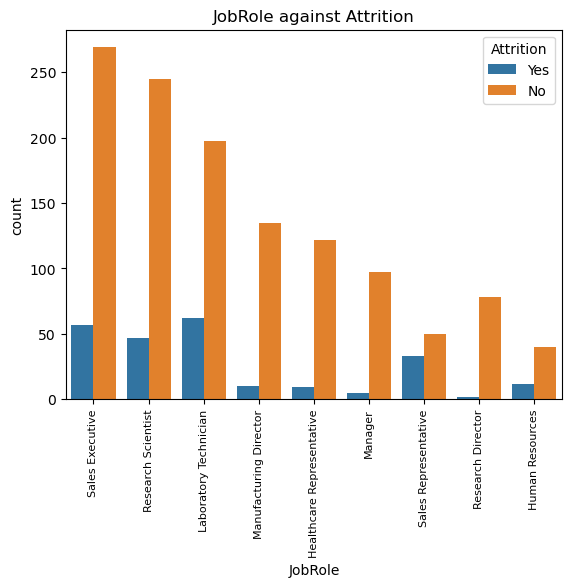

In [40]:
ax= sns.countplot(x='JobRole', hue='Attrition',data=df)
plt.title("JobRole against Attrition")
plt.xticks(rotation=90, fontsize=8)
plt.show()

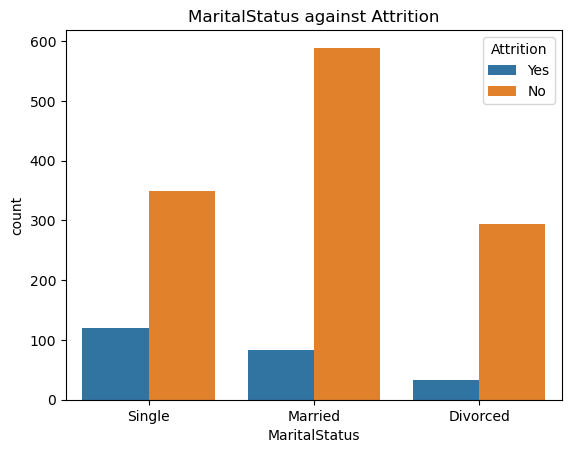

In [41]:
ax= sns.countplot(x='MaritalStatus', hue='Attrition',data=df)
plt.title("MaritalStatus against Attrition")
plt.show()

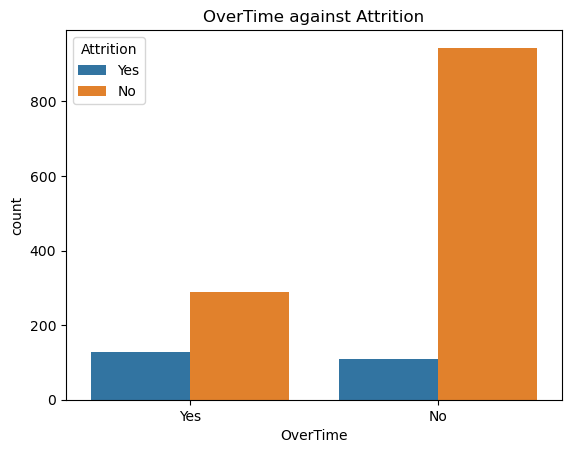

In [42]:
ax= sns.countplot(x='OverTime', hue='Attrition',data=df)
plt.title("OverTime against Attrition")
plt.show()

In [ ]:
#Bivariate analysis intepreted for categorical columns
BusinessTravel- those that rarely travel for business are the ones with the highest rate of attrition
EducationField- those that studied in the Life sciences and Medical disciplines tend to have the highest attrition

Gender-Males have the highest attriton,however could also be because they also account for the highest number in the employee gender mix.

JobRole-Laboratory technicians have the highest attrition.Nevertheless the sales department
(sales executives and sales representatives)accounts for the most attrition in the company

MaritalStatus-single people account for the most attrition,followed by those married and divorced

OverTime-employees that work overtime leave slightly more than those who do not.

In [ ]:
#Bivariate analysis intepreted for numerical columns

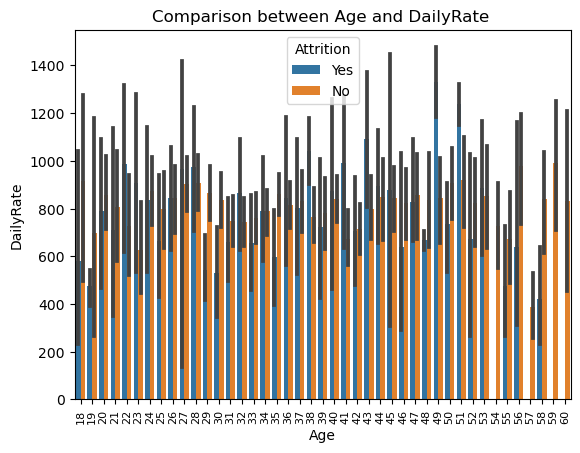

In [43]:
#comparing Age and Daily rate on the basis of Attrition
plt.title("Comparison between Age and DailyRate ")
ax= sns.barplot(x='Age', y='DailyRate',hue='Attrition',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

#attrition is highest between the ages of 30 and 51.There is no uniform pattern of attrition with daily rate changes

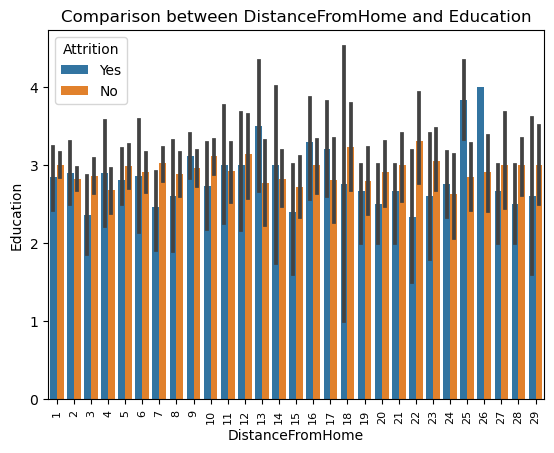

In [44]:
#comparing DistanceFromHome and Education on the basis of Attrition
plt.title("Comparison between DistanceFromHome and Education")
ax= sns.barplot(x='DistanceFromHome', y='Education',hue='Attrition',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()

#the higher the level of education and distance from home,the higher the attrition.A positive relationship

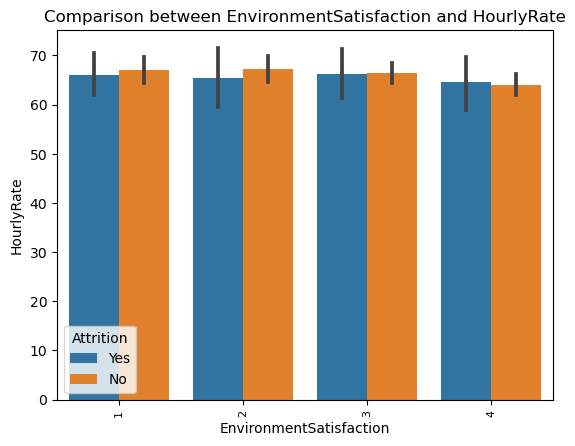

In [45]:
#comparing EnvironmentSatisfaction and HourlyRate on the basis of Attrition
plt.title("Comparison between EnvironmentSatisfaction and HourlyRate")
ax= sns.barplot(x='EnvironmentSatisfaction', y='HourlyRate',hue='Attrition',data=df)
plt.xticks(rotation=90, fontsize=8)
plt.show()
#attrition is at its lowest density at the highest environmental satisfaction.There is no clear  relationship 
#between hourly rate and environment satisfaction

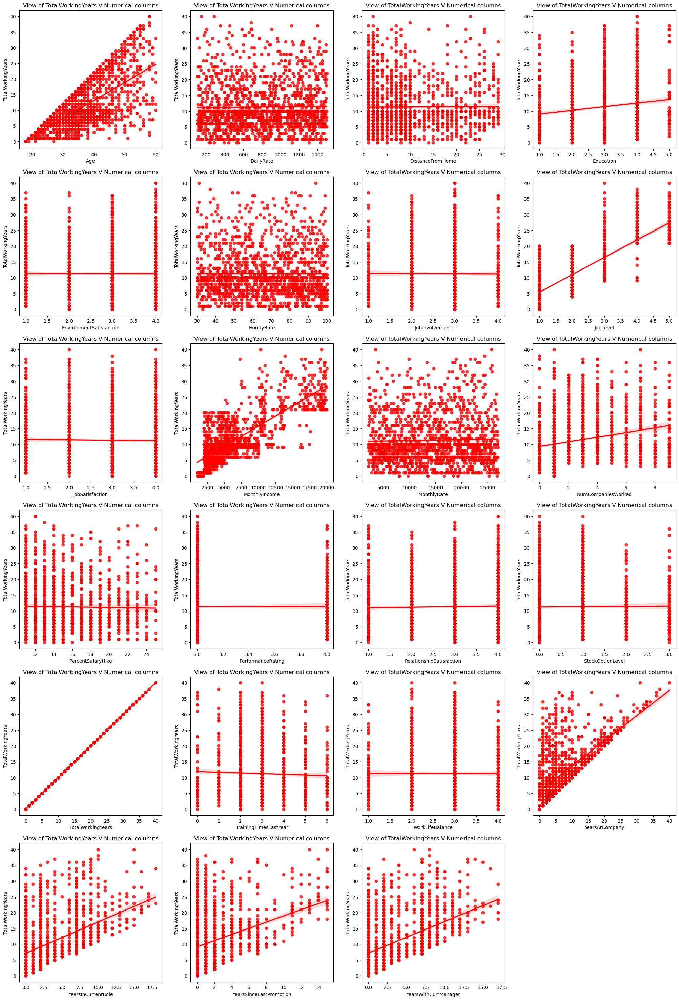

In [46]:
#Total Working Years versus numerical columns
plt.figure(figsize = (25,50), facecolor = 'white')
p=1

for column in numerical:
    if p<=23:
        plt.subplot(8,4,p)
        sns.regplot(x=df[column],y='TotalWorkingYears',data=df,color='red')
        plt.title("View of TotalWorkingYears V Numerical columns")
        plt.xlabel(column,fontsize=10)
      
    p+= 1
plt.show()

In [ ]:
Total Working years has the following relationship with the following features,

Positive
Years in current role
years since last promotion
years with current manager
years at company
monthly income
number of companies worked
age
education



negative
training times last year
job satisfaction


constant/unresponsive
Work life balance
stock options
perfomance rating
relationship satisfaction
percent salary hike
monthly rate
daily rate
distance from home

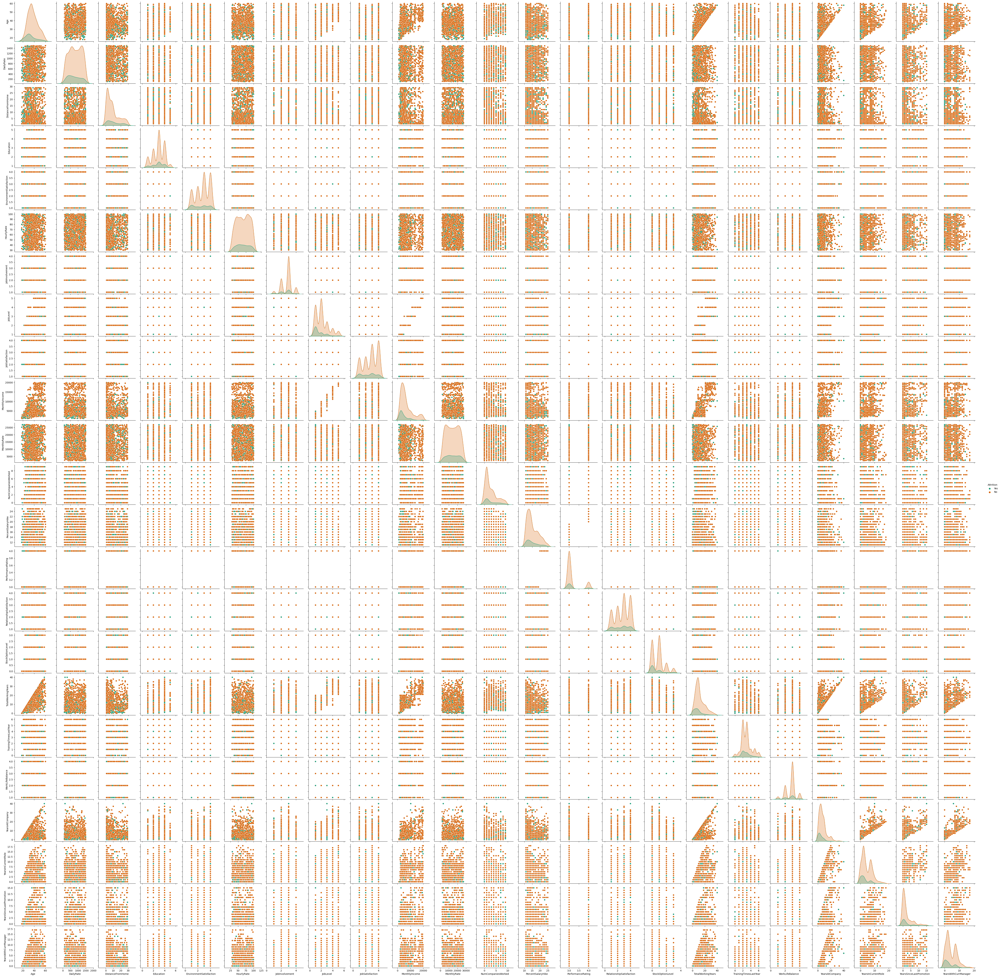

In [47]:
#Multivariate Analysis
sns.pairplot(df,hue="Attrition",palette="Dark2")
plt.show()

In [48]:
#Transforming categorical into numerical data
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

df['BusinessTravel'] = le.fit_transform(df['BusinessTravel'])

df['EducationField'] = le.fit_transform(df['EducationField'])

df['Gender'] = le.fit_transform(df['Gender'])

df['JobRole'] = le.fit_transform(df['JobRole'])

df['MaritalStatus'] = le.fit_transform(df['MaritalStatus'])

df['OverTime'] = le.fit_transform(df['OverTime'])

df['Department'] = le.fit_transform(df['Department'])

df['Attrition'] = le.fit_transform(df['Attrition'])


df.head(12)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2
5,32,0,1,1005,1,2,2,1,4,1,...,3,3,0,8,2,2,7,7,3,6
6,59,0,2,1324,1,3,3,3,3,0,...,4,1,3,12,3,2,1,0,0,0
7,30,0,2,1358,1,24,1,1,4,1,...,4,2,1,1,2,3,1,0,0,0
8,38,0,1,216,1,23,3,1,4,1,...,4,2,0,10,2,3,9,7,1,8
9,36,0,2,1299,1,27,3,3,3,1,...,3,2,2,17,3,2,7,7,7,7


In [49]:
#Tabular view of Correlation
cor=df.corr()
cor

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,0.010146,-0.036311,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.063991,0.077924,-0.031373,0.026846,-0.103369,0.029453,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,0.004174,-0.032981,...,-0.026341,-0.035986,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,0.018355,-0.011716,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
Department,-0.031882,0.063991,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.019395,-0.041583,...,-0.024604,-0.022414,-0.012193,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,-0.016075,-0.001851,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,-0.027128,-0.016547,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EducationField,-0.040873,0.026846,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,0.043163,-0.002504,...,-0.005614,-0.004378,-0.016185,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,1.000000,0.000508,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
Gender,-0.036311,0.029453,-0.032981,-0.011716,-0.041583,-0.001851,-0.016547,-0.002504,0.000508,1.000000,...,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599


<Axes: >

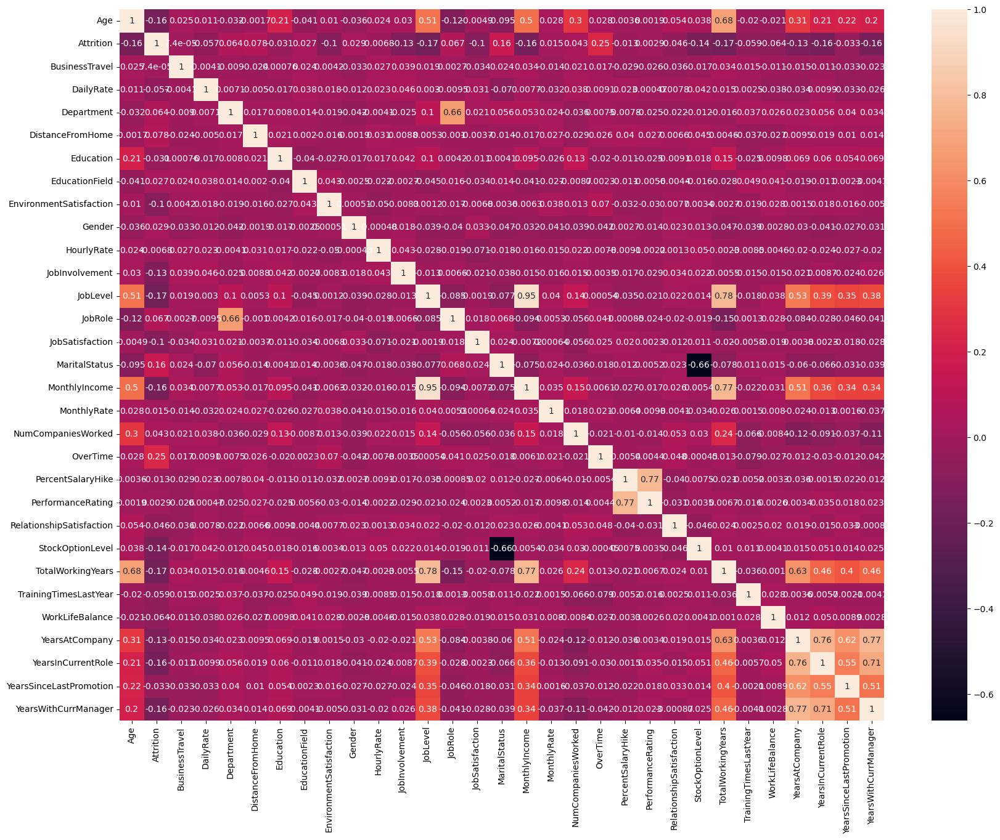

In [50]:
#Visualizing the correlation matrix by plotting heatmap.
f, ax = plt.subplots(figsize=(20, 15))
corr = df.corr()
sns.heatmap(df.corr(),annot=True)

In [ ]:
Attrition has a weak positive correlation with some feature and at the same time has a weak positive correlation with others.

I also see multicollinearity amongst features with the strongest positive correlation (0.95) between job level and monthly income

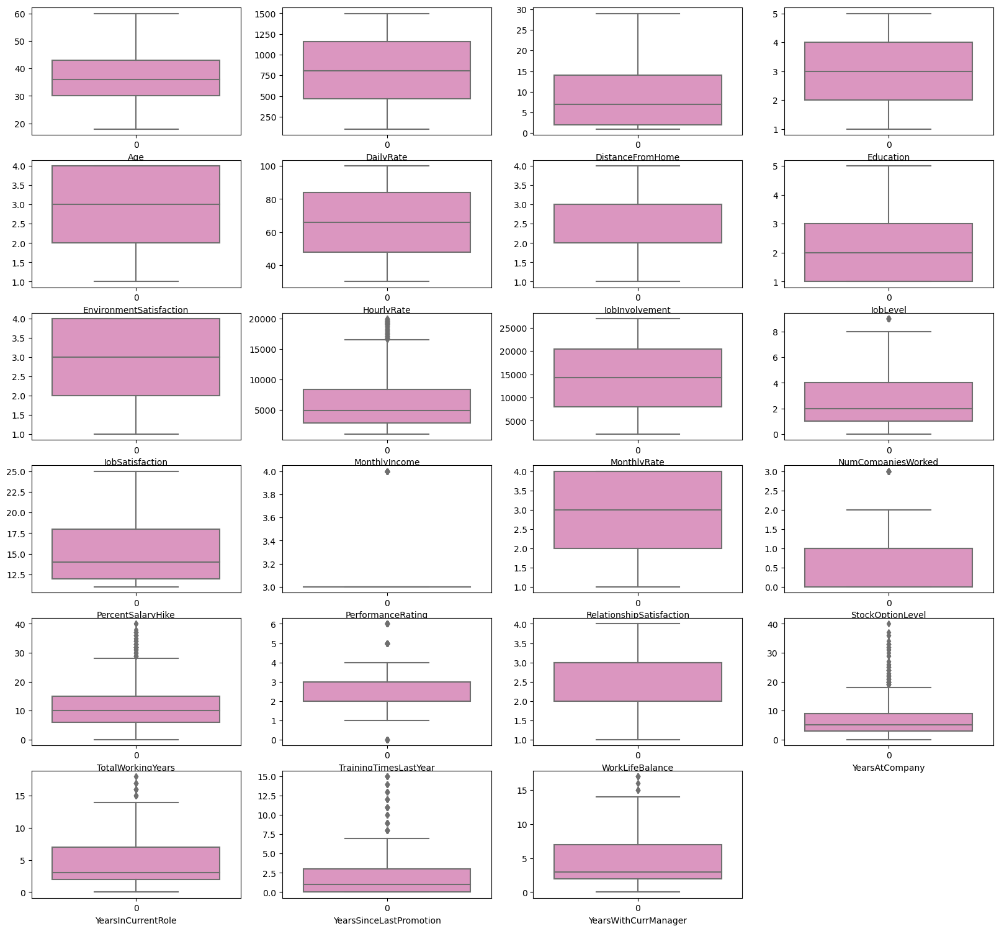

In [52]:
#Visualize outliers and dealing with them
plt.figure(figsize=(20,25))
p=1
for column in numerical:
    if p<=23:
        plt.subplot(8,4,p)
        sns.boxplot(df[column], palette ="Set2_r")
        plt.xlabel(column)
        
    p+=1
    
plt.show()

In [55]:
#Remove outliers using zscore method and Inter quartile range method then compare the two
#'Average Price' the target variable is not subjected to outlier removal
from scipy.stats import zscore
out_features=df[['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager']]
z=np.abs(zscore(out_features))
z

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.742527,1.010909,0.891688,0.660531,1.383138,0.379672,0.057788,1.153254,0.108350,...,0.426230,1.584178,0.932014,0.421642,2.171982,2.493820,0.164613,0.063296,0.679146,0.245834
1,1.322365,1.297775,0.147150,1.868426,0.254625,0.240677,1.026167,0.057788,0.660853,0.291719,...,2.346151,1.191438,0.241988,0.164511,0.155707,0.338096,0.488508,0.764998,0.368715,0.806541
2,0.008343,1.414363,0.887515,0.891688,1.169781,1.284725,1.026167,0.961486,0.246200,0.937654,...,0.426230,0.658973,0.932014,0.550208,0.155707,0.338096,1.144294,1.167687,0.679146,1.155935
3,0.429664,1.461466,0.764121,1.061787,1.169781,0.486709,0.379672,0.961486,0.246200,0.763634,...,0.426230,0.266233,0.932014,0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,1.155935
4,1.086676,0.524295,0.887515,1.868426,1.575686,1.274014,0.379672,0.961486,0.660853,0.644858,...,0.426230,1.191438,0.241988,0.678774,0.155707,0.338096,0.817734,0.615492,0.058285,0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.101159,0.202082,1.703764,0.891688,0.254625,1.224807,1.785511,0.057788,1.153254,0.835451,...,0.426230,0.266233,0.241988,0.735447,0.155707,0.338096,0.327893,0.615492,0.679146,0.314873
1466,0.227347,0.469754,0.393938,1.868426,1.169781,1.175601,1.026167,0.845911,1.567907,0.741140,...,0.426230,1.584178,0.241988,0.293077,1.707500,0.338096,0.001333,0.764998,0.368715,0.806541
1467,1.086676,1.605183,0.640727,0.085049,0.660531,1.038693,1.785511,0.057788,0.660853,0.076690,...,2.346151,0.658973,0.241988,0.678774,2.171982,0.338096,0.164613,0.615492,0.679146,0.314873
1468,1.322365,0.546677,0.887515,0.085049,1.169781,0.142264,1.026167,0.057788,0.660853,0.236474,...,0.426230,1.191438,0.932014,0.735447,0.155707,1.077862,0.325228,0.488900,0.679146,1.086895


In [56]:
#removing the data above zscore and creating new dataframe
df1=df[(z<3).all(axis=1)]
df1.shape

(1387, 31)

In [57]:
#shape of old and new dataframe
print("Original Data Frame-",df.shape[0])
print("New Data Frame-",df1.shape[0])

Original Data Frame- 1470
New Data Frame- 1387


In [58]:
print("Data Loss Percentage-",((df.shape[0]-df1.shape[0])/df.shape[0])*100)
#there is a 3.3% data loss when using zscore to remove outliers

Data Loss Percentage- 5.646258503401361


In [59]:
#new dataframe after removing outliers buy use of zscore
df1

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,3,1,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,4,1,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,2,1,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,4,1,...,3,4,0,17,3,2,9,6,0,8


In [60]:
#Removing outliers using the interquartile range method
#1st quartile
Q1=out_features.quantile(0.25) 

#3rd quartile
Q3=out_features.quantile(0.75)

#IQR
IQR=Q3-Q1
df2=df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]
df2.shape

(779, 31)

In [61]:
print("Data Loss Percentage-",((df.shape[0]-df2.shape[0])/df.shape[0])*100)
#there is a 36% data loss when using IQR method to remove outliers

Data Loss Percentage- 47.006802721088434


In [ ]:
#the interquartile range method will result in massive loss of data above the acceptable 10% loss,therefore 
I will select Z score as the best method

In [63]:
#I am naming the data frame that I will use for training
df=df1

In [64]:
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,1,2,1102,2,1,2,1,2,0,...,3,1,0,8,0,1,6,4,0,5
1,49,0,1,279,1,8,1,1,3,1,...,4,4,1,10,3,3,10,7,1,7
2,37,1,2,1373,1,2,2,4,4,1,...,3,2,0,7,3,3,0,0,0,0
3,33,0,1,1392,1,3,4,1,4,0,...,3,3,0,8,3,3,8,7,3,0
4,27,0,2,591,1,2,1,3,1,1,...,3,4,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,1,884,1,23,2,3,3,1,...,3,3,1,17,3,3,5,2,0,3
1466,39,0,2,613,1,6,1,3,4,1,...,3,1,1,9,5,3,7,7,1,7
1467,27,0,2,155,1,4,3,1,2,1,...,4,2,1,6,0,3,6,2,0,3
1468,49,0,1,1023,2,2,3,3,4,1,...,3,4,0,17,3,2,9,6,0,8


In [65]:
#Checking for Skewness
df.skew()
#Skeweness is acceptable only within the range of -0.5 and 0.5.On that basis,all the columns except 
#DistanceFromHome,EducationField,MonthlyIncome,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,
#TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion and
#YearsWithCurrManager columns fall short of that criteria.

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

In [67]:
#Removing skeweness  using the cuberoot method
df.skew()

df['PerformanceRating']=np.cbrt(df['PerformanceRating'])

In [68]:
#Checking for Skewness after using the cuberoot method
df.skew()
#cuberoot method did not work

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

In [69]:
#Removing skeweness in XLarge Bags using log1p method
df["PerformanceRating"]=np.log1p(df["PerformanceRating"])

In [71]:
#Checking for Skewness after using the log1p method
df.skew()
#log1p method did not work

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

In [72]:
#Removing skeweness using yeo johnson method  (this is the suitable method because the skewness values are positive)
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

In [253]:
#Removing skewness using yeo-johnson
df[['DistanceFromHome','NumCompaniesWorked','EducationField','MonthlyIncome','OverTime','PercentSalaryHike','PerformanceRating','StockOptionLevel','TotalWorkingYears','TrainingTimesLastYear','WorkLifeBalance','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']] = scaler.fit_transform(df[['DistanceFromHome','NumCompaniesWorked','EducationField','MonthlyIncome','OverTime','PercentSalaryHike','PerformanceRating','StockOptionLevel',
'TotalWorkingYears','TrainingTimesLastYear','WorkLifeBalance','YearsAtCompany','YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager']].values)

In [73]:
#check for skeweness again
df.skew()
#skeweness successfully removed from all the relevant columns except Overtime and Performance rating so I will continue.

Age                         0.472280
Attrition                   1.805983
BusinessTravel             -1.426774
DailyRate                  -0.017078
Department                  0.183919
DistanceFromHome            0.954752
Education                  -0.289024
EducationField              0.544868
EnvironmentSatisfaction    -0.325285
Gender                     -0.417296
HourlyRate                 -0.030481
JobInvolvement             -0.501401
JobLevel                    1.126075
JobRole                    -0.386843
JobSatisfaction            -0.345612
MaritalStatus              -0.160952
MonthlyIncome               1.544770
MonthlyRate                 0.030596
NumCompaniesWorked          1.037715
OverTime                    0.954751
PercentSalaryHike           0.800592
PerformanceRating           1.931566
RelationshipSatisfaction   -0.295686
StockOptionLevel            0.962332
TotalWorkingYears           1.034487
TrainingTimesLastYear       0.577614
WorkLifeBalance            -0.557100
Y

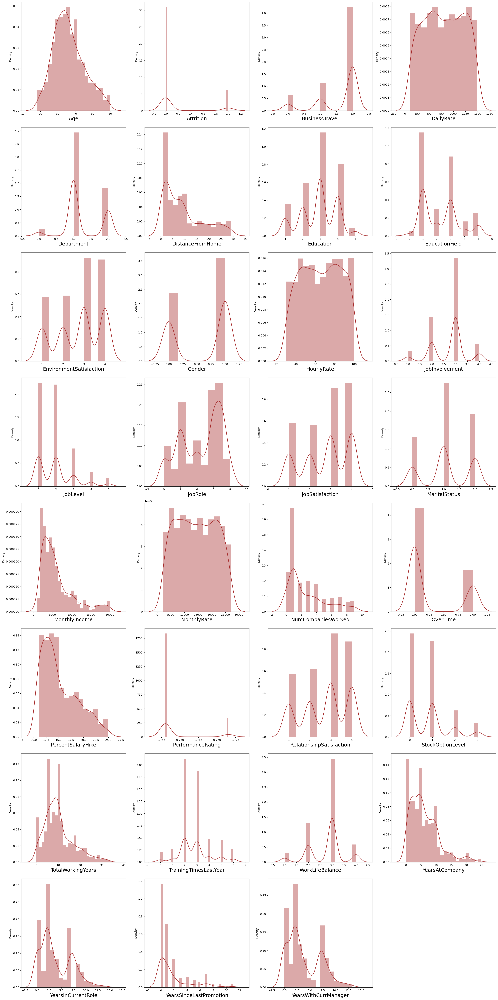

In [74]:
#Visualize distribution of data after removing skeweness

plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in df:
    if plotnumber <=31:
        ax = plt.subplot(8,4,plotnumber)
        sns.distplot(df[column], color = 'brown')
        plt.xlabel(column,fontsize=18)
        
    plotnumber +=1
plt.tight_layout()

In [ ]:
#Dealing with multicollinearity.It be must removed but before that we need to seperate features and labels


In [75]:
#seperate the target and independent variables into x and y
x=df.drop("Attrition",axis=1)
y=df["Attrition"]
print("Feature Dimension=",x.shape)
print("Label Dimension=",y.shape)

Feature Dimension= (1387, 30)
Label Dimension= (1387,)


In [76]:
#Feature scaling and using standard scalarization to remove biasness
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.536681,0.593126,0.734325,1.405373,-1.011249,-0.876177,-0.940815,-0.665328,-1.229911,1.388670,...,-0.424765,-1.575817,-0.929427,-0.343728,-2.171420,-2.501172,-0.022350,0.040903,-0.710699,0.368270
1,1.442111,-0.905354,-1.307769,-0.496337,-0.145521,-1.853858,-0.940815,0.251978,0.813067,-0.239091,...,2.354241,1.199034,0.238250,-0.045106,0.151871,0.336558,0.832812,0.965895,-0.310480,0.982200
2,0.083966,0.593126,1.406752,-0.496337,-0.887573,-0.876177,1.305159,1.169285,0.813067,1.290017,...,-0.424765,-0.650866,-0.929427,-0.493039,0.151871,0.336558,-1.305094,-1.192419,-0.710699,-1.166556
3,-0.368749,-0.905354,1.453896,-0.496337,-0.763898,1.079185,-0.940815,1.169285,-1.229911,-0.485721,...,-0.424765,0.274084,-0.929427,-0.343728,0.151871,0.336558,0.405231,0.965895,0.489958,-1.166556
4,-1.047821,0.593126,-0.533609,-0.496337,-0.887573,-1.853858,0.556501,-1.582635,0.813067,-1.274939,...,-0.424765,1.199034,0.238250,-0.642351,0.151871,0.336558,-0.877513,-0.575758,0.089739,-0.552626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1382,-0.029213,-0.905354,0.193406,-0.496337,1.709609,-0.876177,0.556501,0.251978,0.813067,-1.225613,...,-0.424765,0.274084,0.238250,1.000074,0.151871,0.336558,-0.236141,-0.575758,-0.710699,-0.245661
1383,0.310324,0.593126,-0.479021,-0.496337,-0.392872,-1.853858,0.556501,1.169285,0.813067,-1.176286,...,-0.424765,-1.575817,0.238250,-0.194417,1.700732,0.336558,0.191440,0.965895,-0.310480,0.982200
1384,-1.047821,0.593126,-1.615447,-0.496337,-0.640223,0.101504,-0.940815,-0.665328,0.813067,1.043387,...,2.354241,-0.650866,0.238250,-0.642351,-2.171420,0.336558,-0.022350,-0.575758,-0.710699,-0.245661
1385,1.442111,-0.905354,0.538304,1.405373,-0.887573,0.101504,0.556501,1.169285,0.813067,-0.140439,...,-0.424765,1.199034,-0.929427,1.000074,0.151871,-1.082307,0.619022,0.657565,-0.710699,1.289165


In [77]:
#Checking Variance inflation factor in each scaled column that is x.shape[1](1/(1-R2))
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i)for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,1.850568,Age
1,1.014106,BusinessTravel
2,1.029494,DailyRate
3,2.062034,Department
4,1.019457,DistanceFromHome
5,1.061558,Education
6,1.021559,EducationField
7,1.021370,EnvironmentSatisfaction
8,1.023993,Gender
9,1.022001,HourlyRate


In [ ]:
#All VIF values are below the threshold of 10 therefore acceptable,I will proceed

In [78]:
#Modelling

#Finding the best random state

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    RFR=RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred=RFR.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu,"at random_state",maxRS)

Best accuracy is  0.8896882494004796 at random_state 30


In [79]:
#creating train test split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxRS)

In [81]:
#Import classification algorithms

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix,roc_curve,accuracy_score
from sklearn.model_selection import cross_val_score

In [82]:
#checking accuracy for Random Forest Classifier

RFC=RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.8848920863309353
[[359   4]
 [ 44  10]]
              precision    recall  f1-score   support

           0       0.89      0.99      0.94       363
           1       0.71      0.19      0.29        54

    accuracy                           0.88       417
   macro avg       0.80      0.59      0.62       417
weighted avg       0.87      0.88      0.85       417



In [83]:
#checking testing accuracy:
KNN=KNeighborsClassifier()
KNN.fit(x_train,y_train)
predKNN=KNN.predict(x_test)
print(accuracy_score(y_test,predKNN))
print(confusion_matrix(y_test,predKNN))
print(classification_report(y_test,predKNN))

0.86810551558753
[[353  10]
 [ 45   9]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       363
           1       0.47      0.17      0.25        54

    accuracy                           0.87       417
   macro avg       0.68      0.57      0.59       417
weighted avg       0.83      0.87      0.84       417



In [84]:
#checking accuracy of Logistic Regression

LR=LogisticRegression()
LR.fit(x_train,y_train)
predLR=LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.8920863309352518
[[354   9]
 [ 36  18]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94       363
           1       0.67      0.33      0.44        54

    accuracy                           0.89       417
   macro avg       0.79      0.65      0.69       417
weighted avg       0.88      0.89      0.88       417



In [85]:
#checking accuracy for Support Vector Machine Classifier
SVC=SVC()
SVC.fit(x_train,y_train)
predSVC=SVC.predict(x_test)
print(accuracy_score(y_test,predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC))

0.8896882494004796
[[358   5]
 [ 41  13]]
              precision    recall  f1-score   support

           0       0.90      0.99      0.94       363
           1       0.72      0.24      0.36        54

    accuracy                           0.89       417
   macro avg       0.81      0.61      0.65       417
weighted avg       0.87      0.89      0.86       417



In [86]:
#checking accuracy for Gradient Boosting Classifier
GB=GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB=GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.8896882494004796
[[350  13]
 [ 33  21]]
              precision    recall  f1-score   support

           0       0.91      0.96      0.94       363
           1       0.62      0.39      0.48        54

    accuracy                           0.89       417
   macro avg       0.77      0.68      0.71       417
weighted avg       0.88      0.89      0.88       417



In [87]:
#checking accuracy for AdaBoost Classifier
ABC=AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC=ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.9016786570743405
[[351  12]
 [ 29  25]]
              precision    recall  f1-score   support

           0       0.92      0.97      0.94       363
           1       0.68      0.46      0.55        54

    accuracy                           0.90       417
   macro avg       0.80      0.71      0.75       417
weighted avg       0.89      0.90      0.89       417



In [88]:
#checking accuracy for Bagging Classifier
BC=BaggingClassifier()
BC.fit(x_train,y_train)
predBC=BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.8776978417266187
[[353  10]
 [ 41  13]]
              precision    recall  f1-score   support

           0       0.90      0.97      0.93       363
           1       0.57      0.24      0.34        54

    accuracy                           0.88       417
   macro avg       0.73      0.61      0.64       417
weighted avg       0.85      0.88      0.86       417



In [89]:
#checking accuracy for ExtraTreesClassifier
ET=ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET=ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.8848920863309353
[[359   4]
 [ 44  10]]
              precision    recall  f1-score   support

           0       0.89      0.99      0.94       363
           1       0.71      0.19      0.29        54

    accuracy                           0.88       417
   macro avg       0.80      0.59      0.62       417
weighted avg       0.87      0.88      0.85       417



In [90]:
#Cross validation Score
from sklearn.model_selection import cross_val_score

In [91]:
#Checking CV score for Random Forest Classifier
score=cross_val_score(RFC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predRFC)-score.mean())

[0.85251799 0.86690647 0.86642599 0.84837545 0.85559567]
0.8579643144690025
Difference between Accuracy score and cross validation score is - 0.026927771861932848


In [92]:
#Checking CV score for KNeighbours Classifier
score=cross_val_score(KNN,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predKNN)-score.mean())

[0.84892086 0.84532374 0.83393502 0.84476534 0.8700361 ]
0.848596213282082
Difference between Accuracy score and cross validation score is - 0.019509302305448006


In [93]:
#Checking CV score for Logistic Regression
score=cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predLR)-score.mean())

[0.88129496 0.86690647 0.85559567 0.87364621 0.8700361 ]
0.8694958834376543
Difference between Accuracy score and cross validation score is - 0.022590447497597532


In [94]:
#Checking CV score for Support Vector Machine Classifier
score=cross_val_score(SVC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predSVC)-score.mean())

[0.85611511 0.84532374 0.86642599 0.85559567 0.88086643]
0.8608653871126926
Difference between Accuracy score and cross validation score is - 0.028822862287787077


In [95]:
#Checking CV score for Gradient Boosting Classifier
score=cross_val_score(GB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predGB)-score.mean())

[0.84892086 0.8705036  0.85559567 0.84837545 0.88447653]
0.8615744227722514
Difference between Accuracy score and cross validation score is - 0.028113826628228256


In [96]:
#Checking CV score for AdaBoost Classifier
score=cross_val_score(ABC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predABC)-score.mean())

[0.85971223 0.87410072 0.84476534 0.85559567 0.90252708]
0.8673402072565775
Difference between Accuracy score and cross validation score is - 0.03433844981776302


In [97]:
#Checking CV score for Bagging Classifier
score=cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predBC)-score.mean())

[0.84172662 0.85251799 0.85559567 0.84115523 0.85920578]
0.8500402566033817
Difference between Accuracy score and cross validation score is - 0.027657585123237016


In [98]:
#Checking CV score for ExtraTreesClassifier
score=cross_val_score(ET,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is -",accuracy_score(y_test,predET)-score.mean())

[0.84892086 0.85251799 0.8700361  0.85198556 0.85559567]
0.8558112354881438
Difference between Accuracy score and cross validation score is - 0.02908085084279155


In [ ]:
Model Selection
#I selected Logistic Regression as the best model because it has the more or less the same difference between 
Accuracy and cross validation score compared to the other models but its better in terms  and a better AUC close to 70%.

In [124]:
#Hyper parameter tuning

from sklearn.model_selection import GridSearchCV
parameters={'penalty' : ['l1', 'l2', 'elasticnet', None], 
              'dual' : [True,False],
              'C' : [0.1, 0.2, 0.3, 0.5, 1.0], 
              'fit_intercept': [True,False],
              'random_state':[10,12,14,20, None]}

GVC=GridSearchCV(LogisticRegression(),parameters,cv=5)
GVC.fit(x_train,y_train)

GVC.best_params_
{'penalty':'l2','dual':False,'C':1.0,'fit_intercept':True,'random_state':None}

Final_model=LogisticRegression(penalty='l2',dual=False,C=1.0,fit_intercept=True,random_state=None)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

89.20863309352518


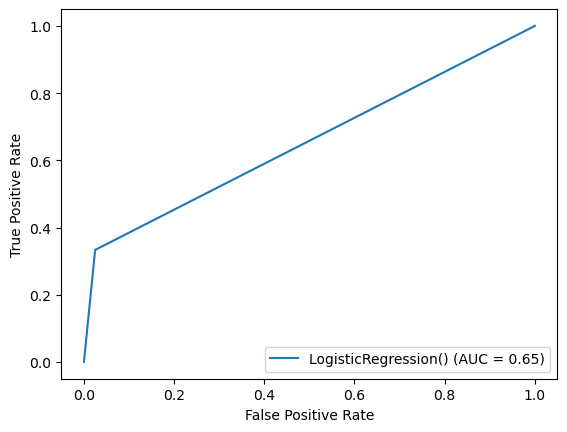

In [125]:
#Plotting ROC and compare AUC for  the model used
from sklearn import metrics
fpr,tpr,thresholds=metrics.roc_curve(y_test,pred)
roc_auc=metrics.auc(fpr,tpr)
display=metrics.RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=Final_model)
display.plot()

In [126]:
#Saving the model
import joblib
joblib.dump(Final_model,"Understanding_the_Attrition_in_HR.pkl")

['Understanding_the_Attrition_in_HR.pkl']

In [127]:
#loading the saved model to get predictions
model=joblib.load("Understanding_the_Attrition_in_HR.pkl")

In [128]:
#Prediction
prediction=model.predict(x_test)
prediction

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [129]:
#the predictions for Attrition
a=np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=prediction
df["Original"]=a
df

,Predicted,Original
0,0,0
1,0,0
2,1,1
3,0,0
4,0,0
...,...,...
412,0,0
413,0,1
414,0,0
415,0,0
